In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import sys
import time
import pytorch_lightning as pl
import torchvision
import random
from scipy.spatial.distance import cdist, directed_hausdorff
sys.path.append(os.path.join(os.getcwd(), "src"))
#from utils import *
from Models.unet import UNet
from Models.splinedist import *
from utils import *
from Datasets.DSB18 import Nuclie_datamodule
%load_ext autoreload
%autoreload 2


In [2]:

# intialize the dataloaders
datamodule = Nuclie_datamodule()
train_loader = datamodule.train_dataloader()
# batch = next(iter(train_loader))

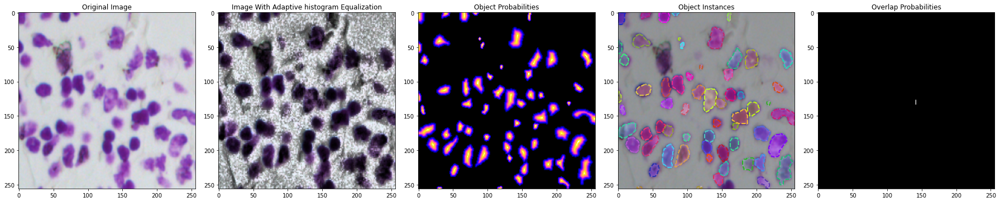

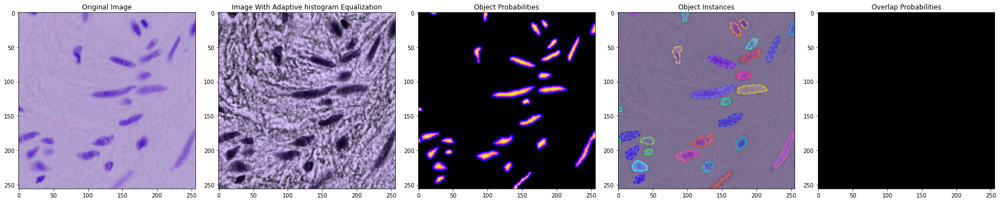

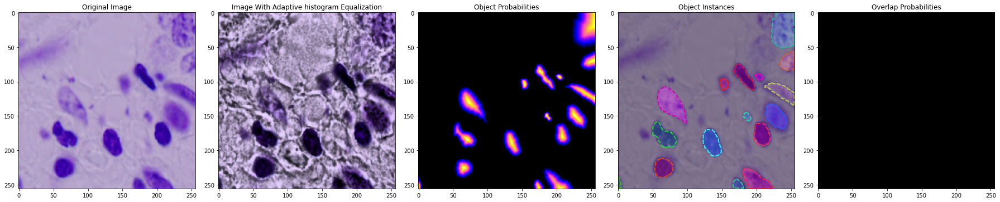

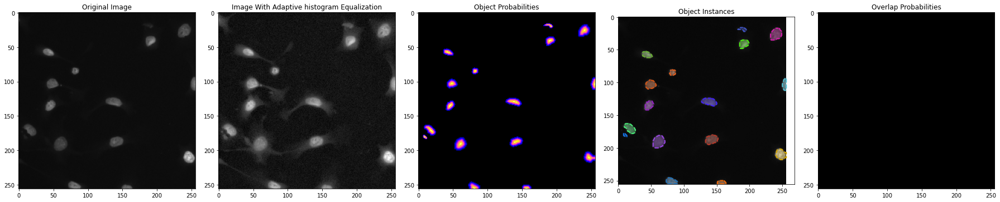

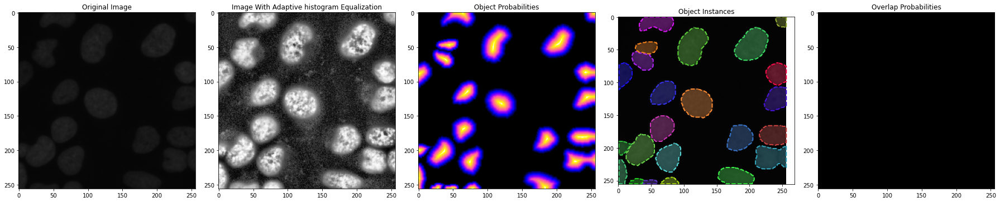

...

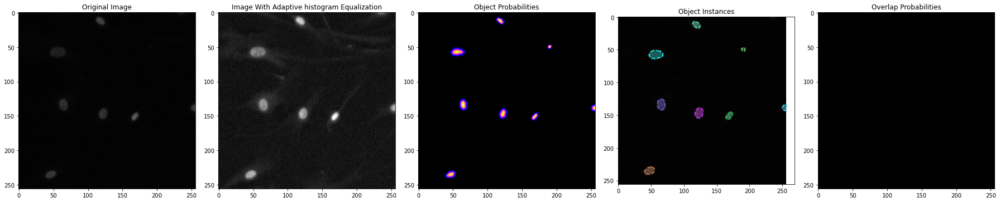

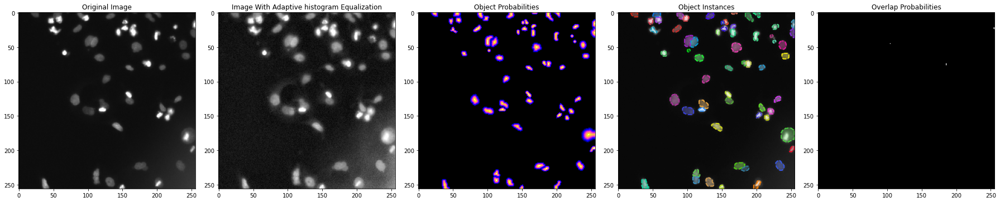

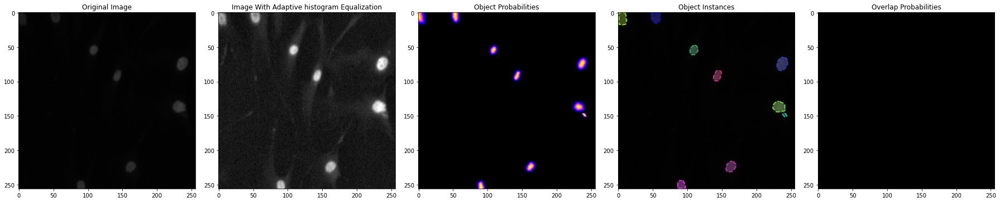

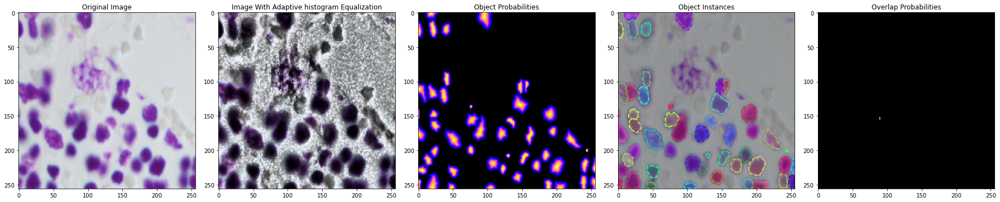

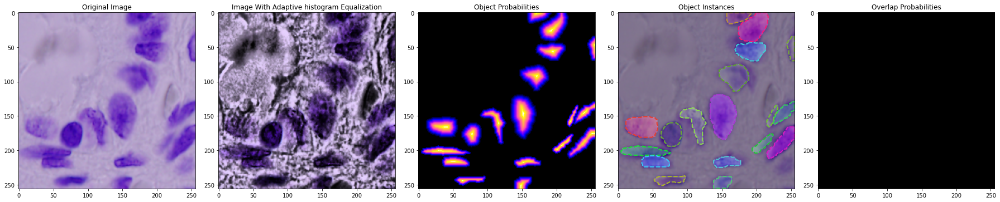

In [3]:
for i, batch in enumerate(train_loader):
    if i>5:
        break
    showBatch(batch)

In [9]:

model = SplineDist()
out = model(batch[0])
objectProbasPredicted, angles, distances = out

In [159]:
objectProbas, overlapProba, objectContours, mask = batch[1]
scores = objectProbas
threshold=0.4
# get index of the sorted scores 
# sortedInstances = list(scores.argsort()[::-1])
sortedInstances = np.unravel_index(np.argsort(scores, axis=None)[::-1], scores.shape)
sortedInstances = list(zip(*sortedInstances))
print(len(sortedInstances))
for i, (instance_i, instance_j) in enumerate(sortedInstances):
    if scores[instance_i, instance_j] < threshold:
        sortedInstances = sortedInstances[:i]
        break
print(len(sortedInstances))


65536
12590


In [4]:

# keep = []

# controlPoints = torch.stack((torch.cos(angles)*distances,
#                              torch.sin(angles)*distances), dim=2)
# x = torch.arange(256)
# y = torch.arange(256)
# xx, yy = torch.meshgrid(x, y)
# shifts = torch.stack((xx, yy), dim=0)

# controlPoints = controlPoints + shifts


# contours = [sampleBsplineFromControlPoints(controlPoints[0, :, :, i, j], 100) for (i, j) in sortedInstances[::10]]





In [5]:
# contours = np.array(list(map(lambda x: np.array(x), contours)))
# contours = contours.transpose(0, 2, 1)
# contours[0]
# for i in range(len(contours)):
#     plt.plot(contours[i][:, 0].detach(), contours[i][:, 1].detach(), 'r')

In [6]:
# contours2 = contours

In [7]:

# M = controlPoints.shape[1]
# T = torch.linspace(0, 1, 400)
# K = torch.arange(0, M, dtype=torch.float)
# tt, kk = torch.meshgrid(T, K)

In [8]:


# B3M = (tt-kk).apply_(B3)
# B3M.shape, controlPoints.shape
# torch.tensordot(controlPoints, B3M, dims=([1], [1]))

In [9]:

# samples = [[controlPoints[0, k, :, 0, 0]*B3M for k in range(M)] for t in T]
# plt.plot(contour[:, 0], contour[:, 1], 'r')


In [10]:

# while len(sortedInstances) > 0:
#     # keep the highest scoring instance
#     currentInstance = sortedInstances.pop()
#     keep.append(currentInstance)

#     C = controlPoints[0, :, :, currentInstance[0], currentInstance[1]]
#     samples = computeSplineSamples(C, 100)
#     print(samples.shape, samles)
    
#     inter = w * h
#     ovr = inter / (areas[i] + areas[order[1:]] - inter)

#     inds = np.where(ovr <= threshold)[0]
#     order = order[inds + 1]
